# 1b. EEG Feature Extraction

- 1b EEG Feature Extraction [Jump To](#run-1b-eeg-feature-extraction)


## Some Ref Links

- The Brain Imaging Data Structure (BIDS): https://bids.neuroimaging.io
- MNE-Python: https://mne.tools/stable/index.html
- SpecParam: https://specparam-tools.github.io and https://github.com/fooof-tools

## Dependencies

General dependencies:
- python = 3.11.13
- numpy = 2.0.2
- scipy = 1.15.3
- pandas = 2.2.3
- matplotlib = 3.10.3

ML dependencies:
- scikit-learn = 1.6.1

EEG specific dependencies:
- mne = 1.9.0
- mne-icalabel = 0.7.0
- autoreject = 0.4.3
- specparam = 2.0.0rc3

# Imports & Functions

## Imports

In [1]:
# General imports
import os
import sys
import gc
import warnings

from datetime import datetime
from pprint import pprint
import time
import pickle
import random
from collections import Counter

# Custom Functions
sys.path.append(os.path.abspath('../Notebooks/Utilities')) 
import cust_utilities as utils

# Maths, Pandas etc
import math
import numpy as np
import pandas as pd
import scipy as sci

# Plots
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.backends.backend_pdf import PdfPages

# MNE-Python
import mne
from mne.channels import combine_channels
# from mne.preprocessing import ICA
# from mne_icalabel import label_components
# from autoreject import AutoReject
# from autoreject import get_rejection_threshold

# SpecParam
from specparam import SpectralGroupModel
from specparam.plts.spectra import plot_spectra
# from specparam import __version__ as specparam_version
# print('Current SpecParam version:', specparam_version)


## EEG Functions

In [2]:
# Setup Montage, Channels & Regions
#

def channels_setup(eeg_raw):

    flag_verbose = (True if 'VERBOSE' in globals() and VERBOSE else False)
    if 'MONTAGE' not in globals():
        raise Exception("MONTAGE variable not found in globals.")
    if 'BRAIN_REGIONS' not in globals():
        raise Exception("BRAIN_REGIONS variable not found in globals.")
    
    # Create a channel group with a dict for each region and: channel names, channel indices
    channel_groups = {}
    used_channels = eeg_raw.ch_names
    for region, channels in BRAIN_REGIONS.items():
        region_channels = [ch for ch in channels if ch in used_channels]
        if region_channels:  # Only include if channels exist
            # Get channel indices
            channel_indices = [used_channels.index(ch) for ch in region_channels]
            channel_groups[region] = {
                'channels': region_channels,
                'indices': channel_indices
        }
    
    if flag_verbose: 
        # Comparison with Raw EEG and Reference Used
        std_1020_montage = mne.channels.make_standard_montage(MONTAGE)
        montage_channels_set = set(std_1020_montage.ch_names)
        subject_channels_set = set(eeg_raw.ch_names)
        regions_channels_set = set([ch for chans in BRAIN_REGIONS.values() for ch in chans])

        print(f'Missing montage - subject: {montage_channels_set - subject_channels_set}')
        print(f'Missing subject - montage {subject_channels_set - montage_channels_set}')
        print(f'Missing regions - subject {regions_channels_set - subject_channels_set}')
        print(f'Missing subject - regions {subject_channels_set - regions_channels_set}')

        # Plot the positions and regions
        ch_groups_list = []
        region_names = []
        for region, info in channel_groups.items():
            ch_groups_list.append(info['indices'])
            region_names.append(region)
        
        fig = mne.viz.plot_sensors(eeg_raw.info, show_names=True, ch_groups=ch_groups_list, show=False, pointsize=65)
        plt.title('Channels with Brain Regions')
        plt.show()

    return channel_groups


In [3]:
# Plot EEG Time Series & Save to PDF
#

def plot_EEG_TD(eeg_FIF, channels, time_range_s=[], pdf_file = None):
    
    """
    EEG Time Domain Plot.

    Parameters
    ----------
    eeg_FIF : FIF
    channels : [str] eg ['P5', 'Pz']
    time_range_s : [nn,nn]
    """

    # Channels Limit
    max_plots = 5
    if len(channels) > max_plots:
        channels = channels[:max_plots]

    # Time Range
    sfreq = eeg_FIF.info['sfreq']
    if time_range_s:
        start = int(time_range_s[0] * sfreq)
        stop = int(time_range_s[1] * sfreq)
    else:
        start = 0
        stop = None

    # Get signal and times for the elected channel(s)
    # Handle Epoched data
    if eeg_FIF.__class__.__name__.startswith('Raw'):
        signal, times = eeg_FIF.get_data(picks=channels, 
                                        start=start, stop=stop,
                                        return_times=True)
    else:
        # warnings.warn("Epoched data detected: plotting may not be accurate for all types.", UserWarning)
        # return
        signal = eeg_FIF.get_data(picks=channels)  # shape: (n_epochs, n_channels, n_times)
        signal = signal.mean(axis=0)  # shape: (n_channels, n_times)
        times = eeg_FIF.times  # shape: (n_times,)

    # plot and copy to pdf
    plt.figure(figsize=(12, 8))
    for i, ch_name in enumerate(channels):
        plt.plot(times, signal[i] * 1e6, label=ch_name, alpha=0.7, linewidth=0.6)
    plt.title('EEG Time Series - Channels: ' + ', '.join(channels))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (µV)')
    plt.legend()
    plt.tight_layout()
    if pdf_file:
        pdf_file.savefig()
    plt.show()

In [4]:
# Plot EEG Frequency Domain / PSD
#

def plot_EEG_PSDs(psds, selection_list=[]):
    """
    EEG Frequency Domain / PSD Plot.

    Parameters
    ----------
    psds : mne.Spectrum
    channels : [str] list of channel names, eg ['P5']
    """

    freqs = psds.freqs
    powers = psds.get_data(return_freqs=False)

    # Average power across all epochs for each channel
    if powers.ndim == 3:  # shape: (n_epochs, n_channels, n_freqs)
        powers = powers.mean(axis=0)  # shape: (n_channels, n_freqs)

    # print('Quick PSD')
    # spectra.plot()
    # plt.show()

    # Get selected subset of PSDs
    if selection_list:
        indices = [psds.ch_names.index(ch) for ch in selection_list if ch in psds.ch_names]
        powers = powers[indices]
        channel_names = [psds.ch_names[i] for i in indices]
    else:
        channel_names = psds.ch_names

    # Log/lin and log/log plot for all channels
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18,6))
    fig.suptitle(f'PSDs', fontsize=20)

    axes[0].set_title("Log-Lin")
    for idx, ch in enumerate(channel_names):
        axes[0].semilogy(freqs, powers[idx], alpha=0.5, label=ch if idx < 10 else None)
    axes[0].set_xlabel("Frequency (Hz)")
    axes[0].set_ylabel("Power ($V^2/Hz$)")
    axes[0].legend(loc='upper right', fontsize='small', ncol=2)

    axes[1].set_title("Log-Log")
    for idx, ch in enumerate(channel_names):
        axes[1].loglog(freqs, powers[idx], alpha=0.5, label=ch if idx < 10 else None)
    axes[1].set_xlabel("Frequency (Hz)")
    axes[1].set_ylabel("")
    axes[1].legend(loc='upper right', fontsize='small', ncol=2)

    plt.tight_layout()
    plt.show()


## SpecParam Functions

In [5]:
# Spectral Parameterisation by group
#

def get_specparam(eeg_raw, channel_groups={}):
    """
    Perform Spectral Parameterisation on EEG time signal

    Parameters
    ----------
    eeg_raw : fif raw eeg continuous or epoched
    group_list : list of brain regions or all channels

    Returns
    -------
    group_summary : pd series of group fit summary
    specparam_df : df of SpecParam results for each channel or region
    """

    flag_verbose = (True if 'VERBOSE' in globals() and VERBOSE else False)

    # Combine channels if regions
    if channel_groups:
        region_channel_indices = {region: info['indices'] for region, info in channel_groups.items()}
        eeg_temp = combine_channels(eeg_raw, region_channel_indices, method='mean')
        test_channel_names = list(channel_groups.keys())
    else:
        eeg_temp = eeg_raw
        test_channel_names = TEST_CHANNELS

    # NB: PSD defaults to Welch for continuous, Multitaper for epoched data, here will typically force to Welch
    psds = eeg_temp.compute_psd(method=psd_params['method'],
                                fmin=psd_params['fmin'], fmax=psd_params['fmax'],
                                exclude=psd_params['exclude'])

    # Get powers and frequency
    freqs = psds.freqs
    powers = psds.get_data(return_freqs=False)

    # Ensure lower bound limit is > 2 * sampling frequency
    # TODO: This overides eg to 2 after the very first check, should be same for all subjects though
    lower, upper = specparam_params['peak_width_limits']    
    freq_res = freqs[1] - freqs[0]
    # print(f'Before {lower} with res {freq_res}')
    if lower <= freq_res:
        warnings.warn(f'Lower peak_width {lower} <= frequency res {freq_res}. Adjusted to {2 * freq_res}', UserWarning)
        specparam_params['peak_width_limits'][0] = 2 * freq_res
    # print(f"After {specparam_params['peak_width_limits'][0]} with res {freq_res}")

    # If Epoched then average powers
    # TODO: Does averaging lose information?
    if powers.ndim == 3:  # shape: (n_epochs, n_channels, n_freqs)
        powers = np.mean(powers, axis=0)  # shape: (n_channels, n_freqs)

    # Initialise SpecParam Group Model & fit it
    progress_flag = 'tqdm.notebook' if flag_verbose else None
    fg = SpectralGroupModel(peak_width_limits=specparam_params['peak_width_limits'], 
                                max_n_peaks=specparam_params['max_n_peaks'], 
                                min_peak_height=specparam_params['min_peak_height'],
                                peak_threshold=specparam_params['peak_threshold'],
                                aperiodic_mode=specparam_params['aperiodic_mode'])
    fg.fit(freqs, powers, specparam_params['fit_window'], progress=progress_flag, n_jobs=-1)

    # Inspect the group fit
    group_summary = inspect_spm_group(fg, 
                                      error_threshold=specparam_params['fit_error_threshold'], 
                                      r2_threshold=specparam_params['fit_r2_threshold'])
    if group_summary['SPM_fit_quality_warning']:
        warnings.warn(f'SpecParam Fit Issues', UserWarning)

    # Amend the SpecParm results with the 'channel' name
    specparam_df = fg.to_df(specparam_params['max_n_peaks'])
    specparam_df.insert(0, 'channel', eeg_temp.ch_names)

    # Output for test sample
    if flag_verbose:
        # PSDs - All
        print(psds)
        print(psds.info)
        plot_EEG_PSDs(psds)
        # PSDS - Test Channels
        if not channel_groups:
            plot_EEG_PSDs(psds, test_channel_names)
        
        # Overall SpecParam group results
        print(f'Group Summary: \n{group_summary}')
        fg.print_results()
        fg.plot()
        plt.show()

        # Summary Comparison of Selected Channels or Regions
        plot_spm_comparisons(psds, fg, test_channel_names)

        # Plot flagged channels in detail
        for channel_idx in group_summary['flagged_channels']:
            channel_name = psds.ch_names[channel_idx]
            fm = fg.get_model(ind=channel_idx, regenerate=True)
            plot_spm_fit(fm, channel_name)

        # Plot test channels in detail
        for channel_name in test_channel_names:
            channel_idx = psds.ch_names.index(channel_name)
            fm = fg.get_model(ind=channel_idx, regenerate=True)
            plot_spm_fit(fm, channel_name)

    return group_summary, specparam_df


In [6]:
# Inspect the quality of a SpecParam Group fit
#

def inspect_spm_group(fg, error_threshold = 0.05, r2_threshold = 0.1):

    fit_warning = False
    flagged_channels = []

    # Check Null Fits
    if fg.n_null_ > 0:
        fit_warning = True

    # Check the Mean Error & R^2
    error_mean = np.mean(fg.get_params('error'))
    r_squared_mean = np.mean(fg.get_params('r_squared'))
    if (error_mean > error_threshold) or (r_squared_mean < r2_threshold):
        fit_warning = True

    # TODO: Is this check too time consuming!?
    # Capture the worst channels
    flagged_channels = [ind for ind, res in enumerate(fg) if res.error > error_threshold]
    if len(flagged_channels) > 0:
        fit_warning = True
    
    group_summary = pd.Series({
        'SPM_fit_quality_warning': fit_warning,
        'spectra_count': len(fg),
        'null_fits': fg.n_null_,
        'error_mean': error_mean,
        'r2_mean': r_squared_mean,
        'flagged_channels': flagged_channels,
        'peaks_count_max': np.max(fg.n_peaks_),
        'peaks_count_mean': np.mean(fg.n_peaks_)
        })
    
    return group_summary


In [7]:
# Plot a SpecParam Model fit in Detail
#

def plot_spm_fit(fm, channel_name):

    print(f'SpecParam for Channel: {channel_name}')
    fm.print_results()

    # Three Plots
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

    fig.suptitle(f'SpecParam Fit for Channel: {channel_name}', fontsize=20)
    axes[0].set_title('Log/Lin Fit')
    fm.plot(plot_peaks='shade', peak_kwargs={'color' : 'green'}, ax=axes[0])

    freqs = fm.freqs
    flattened_data = fm.get_model(component='peak', space='log')
    axes[1].set_title('Flattened - Offset Removed')
    axes[1].plot(freqs, flattened_data)

    axes[2].set_title('Log/Log Fit')
    fm.plot(plot_peaks='shade', peak_kwargs={'color' : 'green'}, plt_log=True, ax=axes[2])
    plt.show()
    

In [8]:
# Plot SpecParam Results - Comparison of selected Channels or Regions
#

def plot_spm_comparisons(psds, fg, selection_list):

    # Establish plot size
    if len(selection_list) > 9:
        warnings.warn("Too many plots requested; only the first 9 will be shown.", UserWarning)
        selection_list = selection_list[:9]

    n_cols = 3
    n_rows = int(np.ceil(len(selection_list) / n_cols))
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(6 * n_cols, 6 * n_rows))
    fig.suptitle(f'SpecParam Fits Comparisons - Log/Lin', fontsize=20)
    axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]

    # For each selection element, a group or a channel
    for i, selection_name in enumerate(selection_list):
        chn_idx = psds.ch_names.index(selection_name)
        chn_name = selection_name

        axes[i].set_title(f'{selection_name.capitalize()}')
        fm = fg.get_model(ind=chn_idx, regenerate=True)
        fm.plot(plot_peaks='shade', peak_kwargs={'color' : 'green'}, ax=axes[i])

    # Hide any unused subplots
    for j in range(len(selection_list), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Run: 1b EEG Feature Extraction

In [9]:
# Run Details & Parameters
#

#---- Run Parameters --------------------------------
# Study Details
study_name = 'IOWA_Rest'

# Run Name, Data Source & Test Mode
run_description = 'test_run'
data_source = '1a_EEG_Preprocessing_Run_20250724_full_ica'
test_mode = True

# Preprocessing Parameters
psd_params = {'method': 'welch', #welch or multitaper (often used for epoched data)
              'fmin': 1, 'fmax': 100,       
              'exclude': []  # Includes all, even bad channels
              }
specparam_params = {'peak_width_limits': [1, 12],
                    'max_n_peaks': 6,
                    'min_peak_height': 0.1,
                    'peak_threshold': 2.0,
                    'aperiodic_mode': 'fixed',
                    'fit_window' : [2, 40],
                    'fit_error_threshold': 0.1,
                    'fit_r2_threshold': 0.9
                     }

# Montage & Regions
# Standard brain region groupings based on 10-20 system, with the 10-10 extension

MONTAGE = 'standard_1020'

BRAIN_REGIONS = {
    'frontal': ['Fp1', 'Fp2', 'Fpz', 'AF3', 'AF4', 'AF7', 'AF8', 'AFz',
                'F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'Fz'],
    'central': ['FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'FCz',
                'FT10', 'FT8', 'FT7', 'FT9',
                'C1', 'C2', 'C5', 'C6', 'C2', 
                'CP3','CP4','CPz',
                'C3', 'Cz', 'C4', 'CP5', 'CP1', 'CP2', 'CP6', 
                'T7', 'T8', 'C5', 'C6', 'TP7', 'TP8', 'TP9', 'TP10'],
    'posterior': ['O1', 'Oz', 'O2', 'PO9', 'PO7', 'PO3', 'POz', 'PO4', 'PO8', 'PO10',
                  'P1','P2','P3','P4', 'P5','P6','P7','P8','Pz']
    }
#----------------------------------------------------

# Get existing study details, if exists
study_folder_path = utils.get_folder_path('Study_' + study_name)
study_info = pd.read_pickle(study_folder_path + '/study_inf.pkl', compression='zip')
study_subjects_df = pd.read_pickle(study_folder_path + '/study_subjects_df.pkl', compression='zip')

# EEG Preprocessed data
eeg_preprocessed_data_path = utils.get_folder_path(study_info['eeg_processing_results_path'] + '/' + data_source + '/Cleaned_files' )

# Setup the processing run and results folder & save params
current_date = datetime.now().strftime('%Y%m%d')
run_name = f'1b_EEG_Features_Results_Run_{current_date}_{run_description}'
run_results_path = utils.extend_folder_path(study_info['eeg_processing_results_path'], run_name, exists_ok=False)

run_details = pd.Series({
    'study_name': study_name,
    'run_name': run_name,
    'eeg_preprocessed_data': data_source,
    'psd_params': psd_params,
    'specparam_params': specparam_params,
})
run_details.to_pickle(run_results_path + '/run_details.pkl', compression='zip')

# Set progress messages, testing
if test_mode:
    VERBOSE = True
    TEST_SUBJECTS = [0,5,101]
    TEST_CHANNELS = ['F5', 'C3', 'P3', 'F6', 'C6', 'P6']
else:
    VERBOSE = False
    TEST_SUBJECTS = []
    TEST_CHANNELS = []
    
del current_date, study_name, run_description, study_folder_path


EEG Feature Extraction
- Study: IOWA_Rest ds004584-1.0.0
- Run: 1b_EEG_Features_Results_Run_20250725_test_run
- EEG Preprocessed Data Source: 1a_EEG_Preprocessing_Run_20250724_full_ica
- PSD Params: {'method': 'welch', 'fmin': 1, 'fmax': 100, 'exclude': []}
- SpecParam Params: {'peak_width_limits': [1, 12], 'max_n_peaks': 6, 'min_peak_height': 0.1, 'peak_threshold': 2.0, 'aperiodic_mode': 'fixed', 'fit_window': [2, 40], 'fit_error_threshold': 0.1, 'fit_r2_threshold': 0.9}

-----------------------------------------------------------------------------------------------
Subject: sub-001
---Get EEG Preprocessed Data - FIF ----------------------------------
Reading /Users/stuartgow/GitHub/EEG_ML_Pipeline/Data/Study_IOWA_Rest/1_EEG_Processing_Results/1a_EEG_Preprocessing_Run_20250724_full_ica/Cleaned_files/sub-001_preprocessed_epo.fif ...
    Found the data of interest:
        t =       0.00 ...     998.00 ms
        0 CTF compensation matrices available
Not setting metadata
281 matching ev

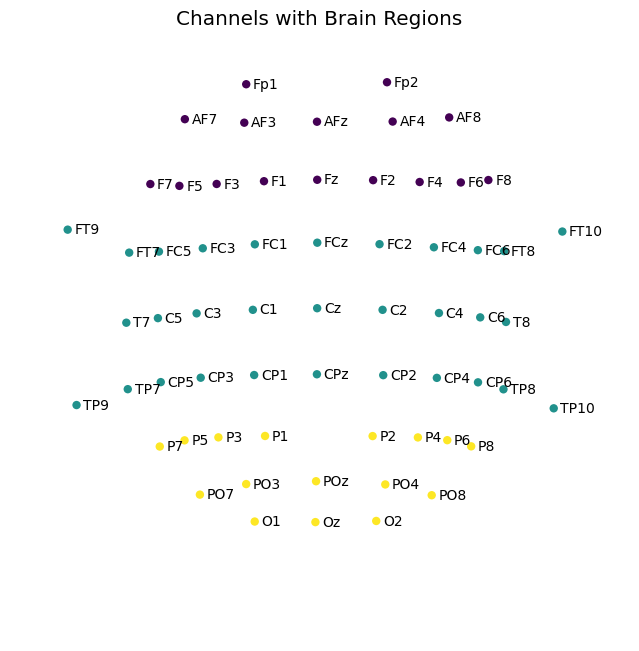

Not setting metadata
281 matching events found
No baseline correction applied
0 projection items activated
Effective window size : 1.000 (s)


/var/folders/wd/rhzj_w8570g_y66t6j6mh4zw0000gn/T/ipykernel_88956/1160174143.py:45: UserWarning: Lower peak_width 1 <= frequency res 1.0. Adjusted to 2.0
  warnings.warn(f'Lower peak_width {lower} <= frequency res {freq_res}. Adjusted to {2 * freq_res}', UserWarning)


Running group fits.:   0%|          | 0/3 [00:00<?, ?it/s]

<Power Spectrum (from Epochs, welch method) | 281 epochs × 3 channels × 100 freqs, 1.0-100.0 Hz>
<Info | 7 non-empty values
 bads: []
 ch_names: frontal, central, posterior
 chs: 3 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 3
 projs: []
 sfreq: 500.0 Hz
>


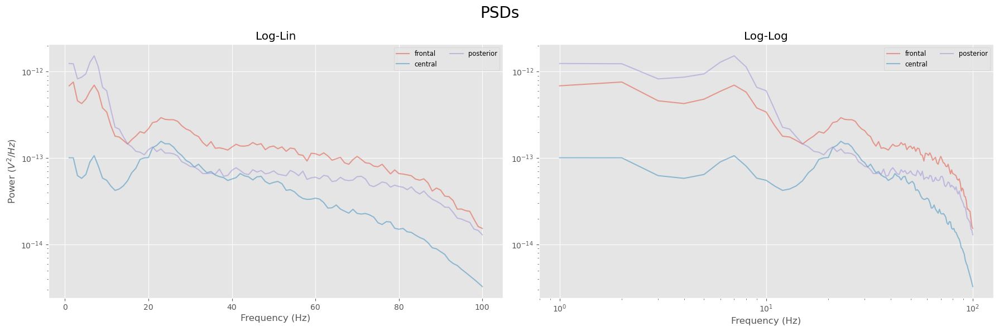

Group Summary: 
SPM_fit_quality_warning       False
spectra_count                     3
null_fits                         0
error_mean                 0.037431
r2_mean                    0.922178
flagged_channels                 []
peaks_count_max                   2
peaks_count_mean                2.0
dtype: object
                                                                                                  
                                          GROUP RESULTS                                           
                                                                                                  
                             Number of power spectra in the Group: 3                              
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                        

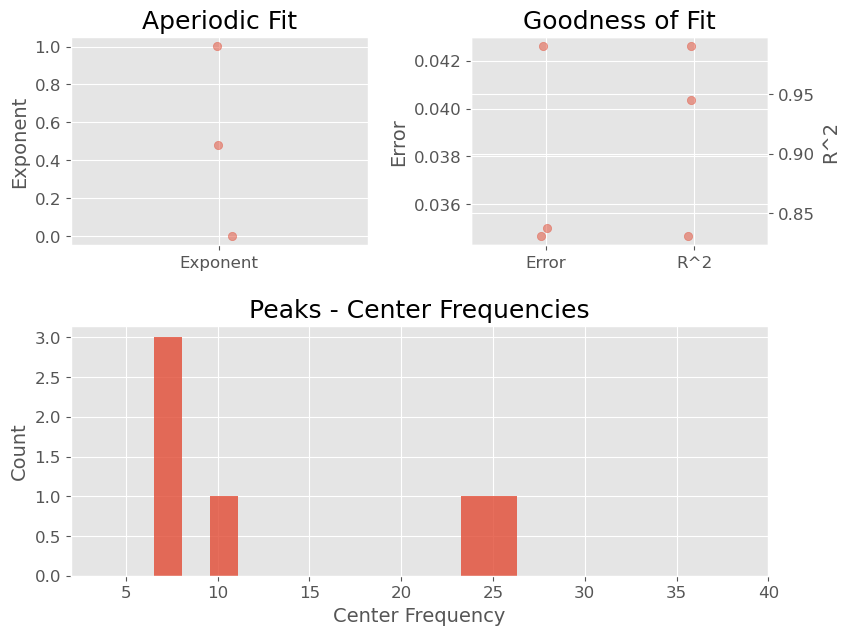

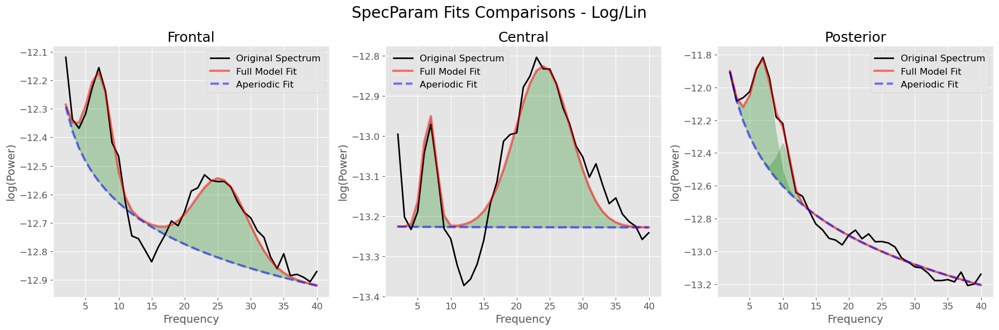

SpecParam for Channel: frontal
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -12.1476, 0.4819                                         
                                                                                                  
                                       2 peaks were found:                    

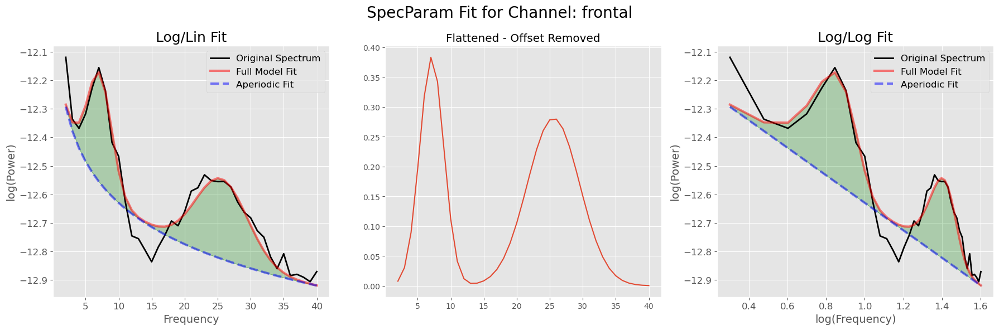

SpecParam for Channel: central
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -13.2251, 0.0017                                         
                                                                                                  
                                       2 peaks were found:                    

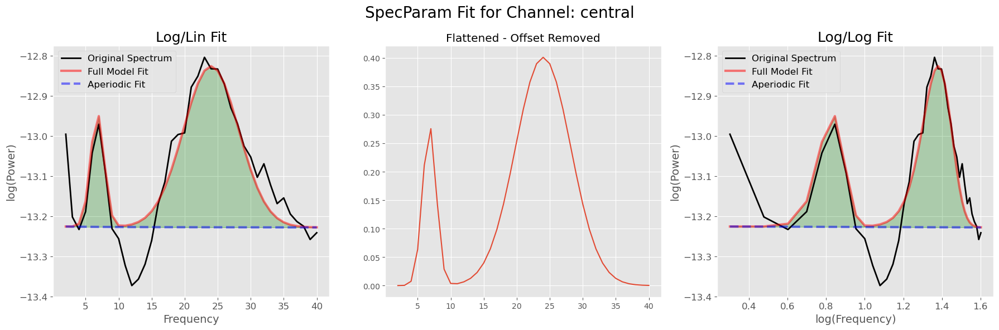

SpecParam for Channel: posterior
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6008, 1.0016                                         
                                                                                                  
                                       2 peaks were found:                  

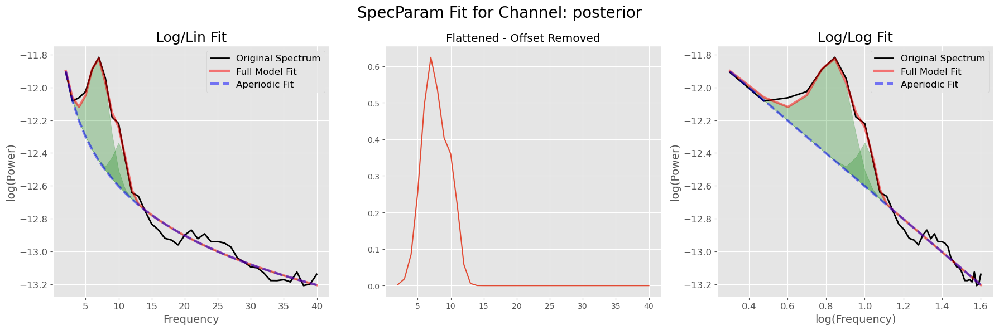

Effective window size : 1.000 (s)


Running group fits.:   0%|          | 0/63 [00:00<?, ?it/s]

/var/folders/wd/rhzj_w8570g_y66t6j6mh4zw0000gn/T/ipykernel_88956/1160174143.py:68: UserWarning: SpecParam Fit Issues
  warnings.warn(f'SpecParam Fit Issues', UserWarning)


<Power Spectrum (from Epochs, welch method) | 281 epochs × 63 channels × 100 freqs, 1.0-100.0 Hz>
<Info | 11 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, P3, P7, ...
 chs: 63 EEG
 custom_ref_applied: True
 dig: 66 items (3 Cardinal, 63 EEG)
 file_id: 4 items (dict)
 highpass: 1.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 meas_id: 4 items (dict)
 nchan: 63
 projs: []
 sfreq: 500.0 Hz
>


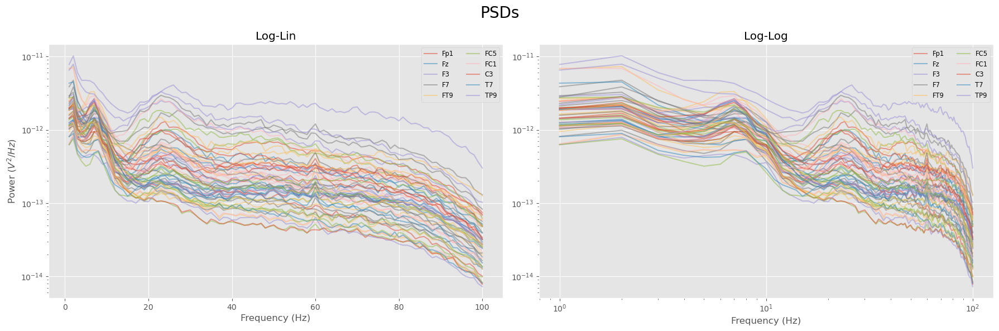

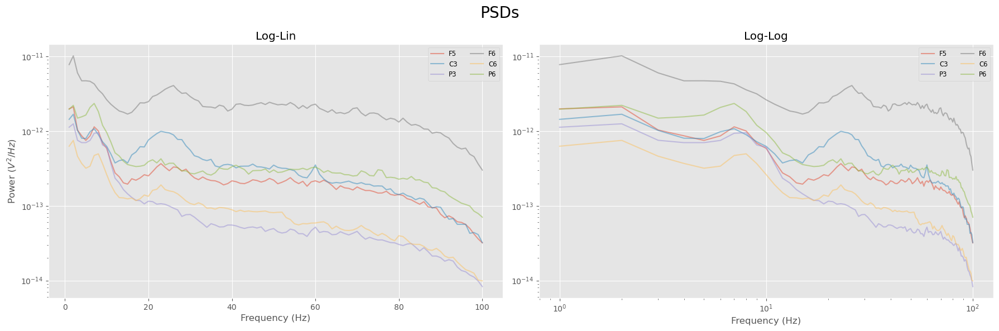

Group Summary: 
SPM_fit_quality_warning        True
spectra_count                    63
null_fits                         0
error_mean                 0.042768
r2_mean                    0.920499
flagged_channels               [33]
peaks_count_max                   4
peaks_count_mean           2.190476
dtype: object
                                                                                                  
                                          GROUP RESULTS                                           
                                                                                                  
                             Number of power spectra in the Group: 63                             
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                        

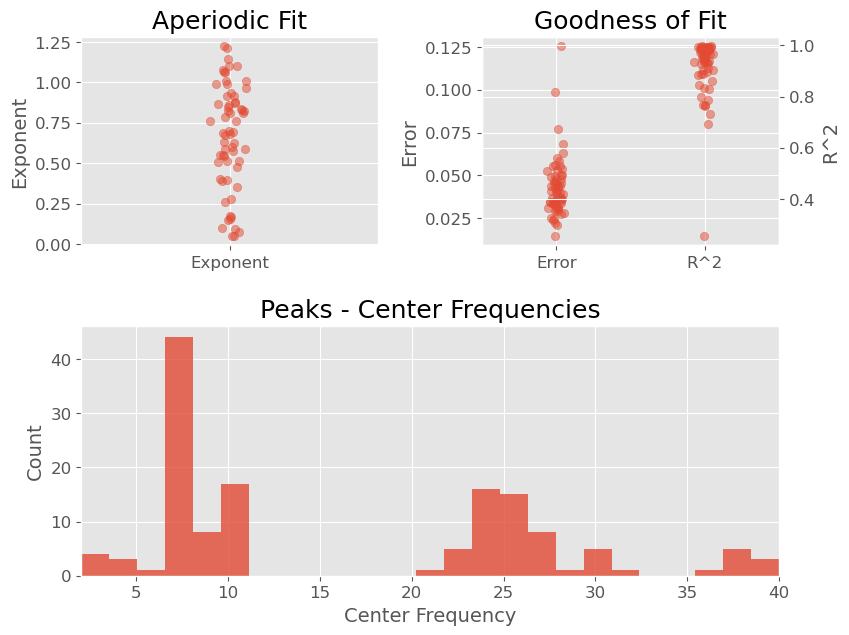

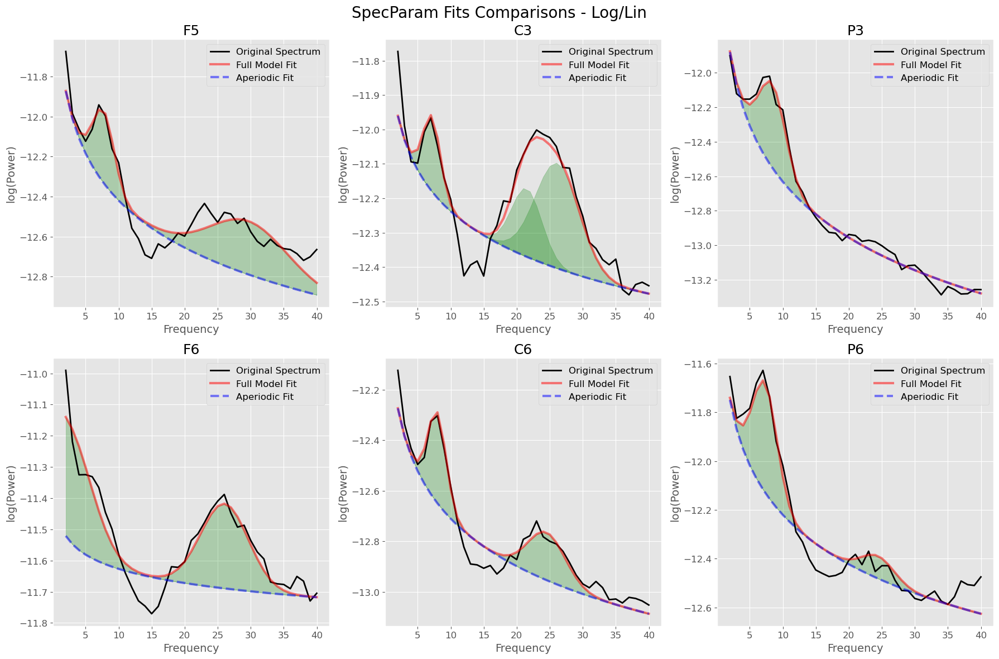

SpecParam for Channel: AFz
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7935, 0.2786                                         
                                                                                                  
                                       0 peaks were found:                        

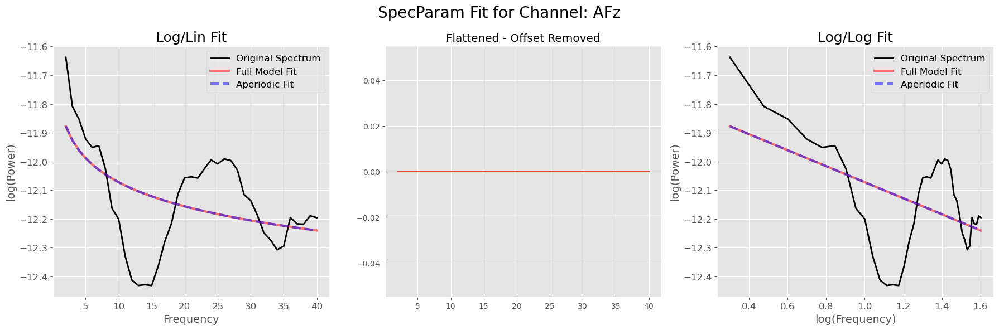

SpecParam for Channel: F5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6364, 0.7836                                         
                                                                                                  
                                       2 peaks were found:                         

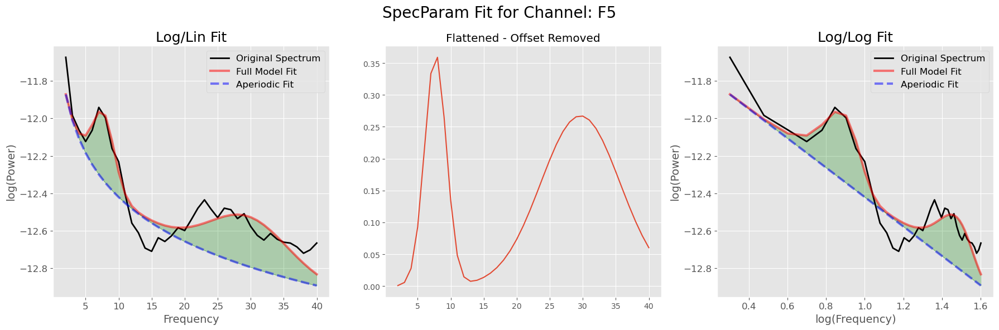

SpecParam for Channel: C3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8405, 0.3976                                         
                                                                                                  
                                       3 peaks were found:                         

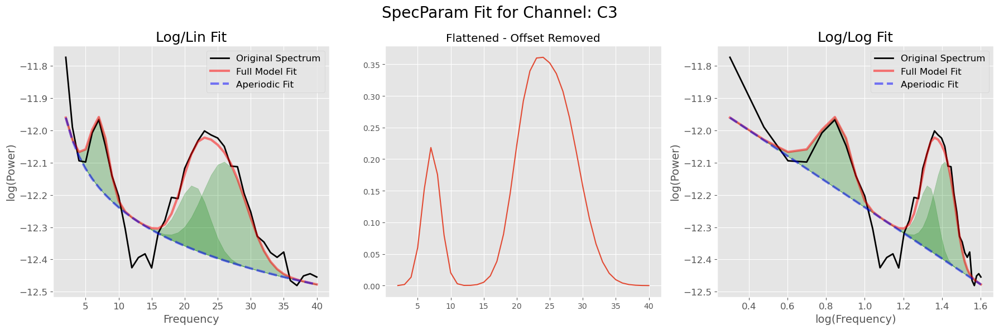

SpecParam for Channel: P3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.5569, 1.0751                                         
                                                                                                  
                                       1 peaks were found:                         

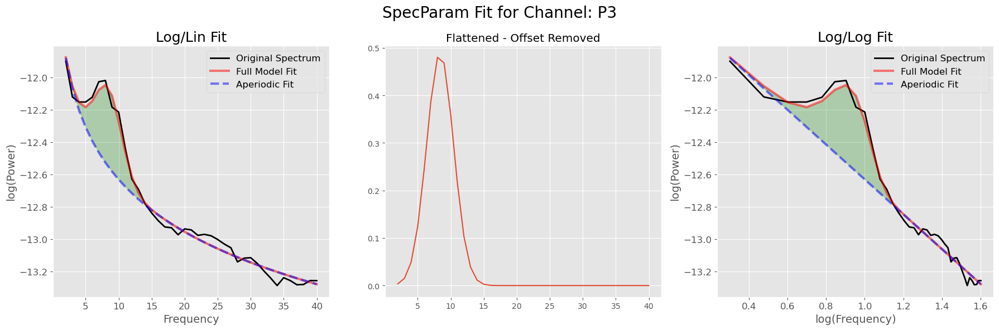

SpecParam for Channel: F6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.4757, 0.1510                                         
                                                                                                  
                                       2 peaks were found:                         

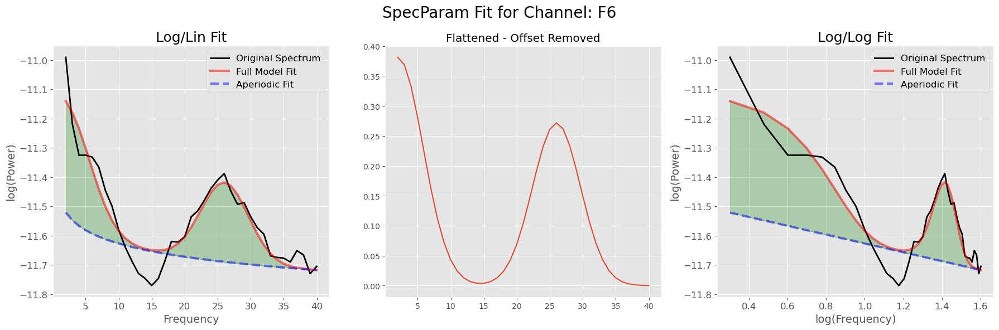

SpecParam for Channel: C6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -12.0852, 0.6252                                         
                                                                                                  
                                       2 peaks were found:                         

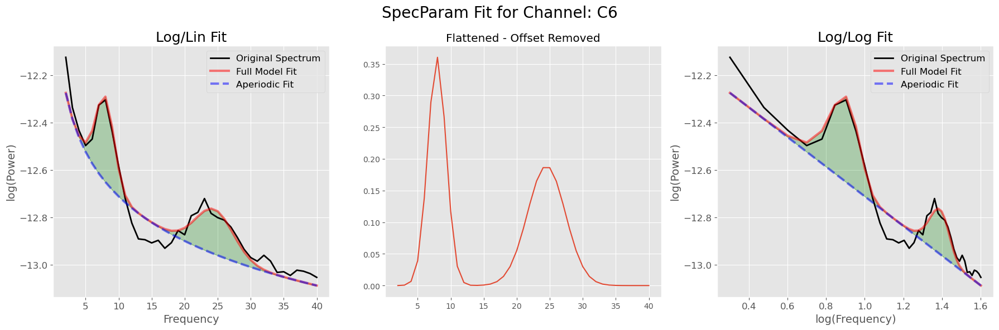

SpecParam for Channel: P6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.5466, 0.6738                                         
                                                                                                  
                                       2 peaks were found:                         

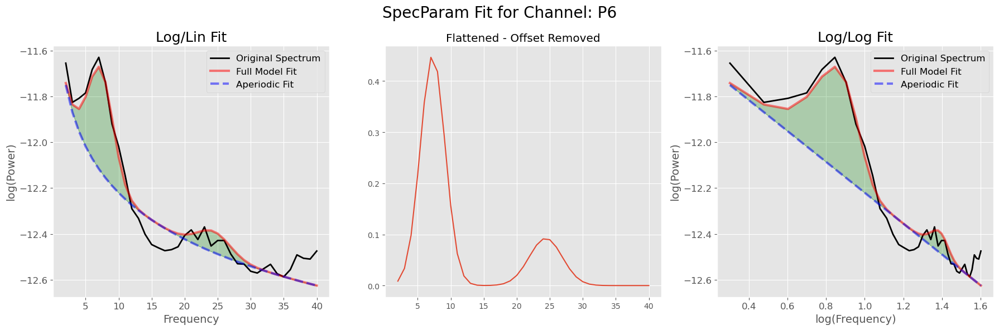


-----------------------------------------------------------------------------------------------
Subject: sub-006
---Get EEG Preprocessed Data - FIF ----------------------------------
Reading /Users/stuartgow/GitHub/EEG_ML_Pipeline/Data/Study_IOWA_Rest/1_EEG_Processing_Results/1a_EEG_Preprocessing_Run_20250724_full_ica/Cleaned_files/sub-006_preprocessed_epo.fif ...
    Found the data of interest:
        t =       0.00 ...     998.00 ms
        0 CTF compensation matrices available
Not setting metadata
252 matching events found
No baseline correction applied
0 projection items activated
Description: None on None
<EpochsFIF | 252 events (all good), 0 – 0.998 s (baseline off), ~60.6 MiB, data loaded,
 '1': 252>
<Info | 11 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, P3, P7, ...
 chs: 63 EEG
 custom_ref_applied: True
 dig: 66 items (3 Cardinal, 63 EEG)
 file_id: 4 items (dict)
 highpass: 1.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 mea

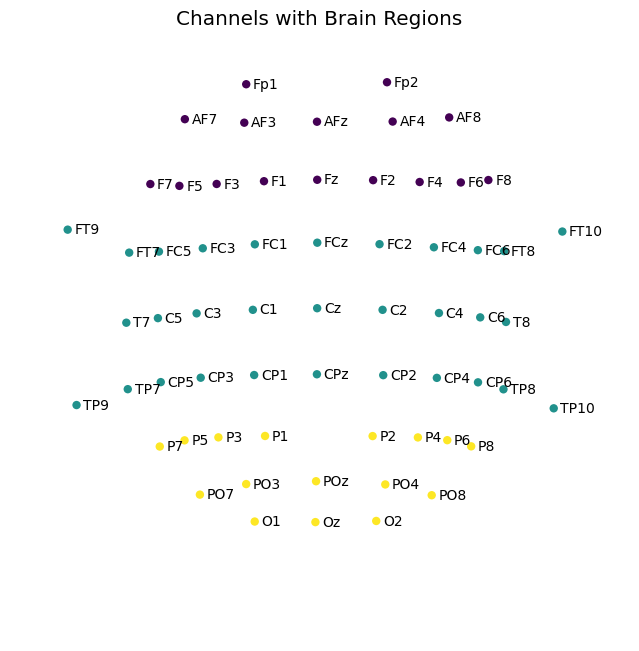

Not setting metadata
252 matching events found
No baseline correction applied
0 projection items activated
Effective window size : 1.000 (s)


Running group fits.:   0%|          | 0/3 [00:00<?, ?it/s]

<Power Spectrum (from Epochs, welch method) | 252 epochs × 3 channels × 100 freqs, 1.0-100.0 Hz>
<Info | 7 non-empty values
 bads: []
 ch_names: frontal, central, posterior
 chs: 3 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 3
 projs: []
 sfreq: 500.0 Hz
>


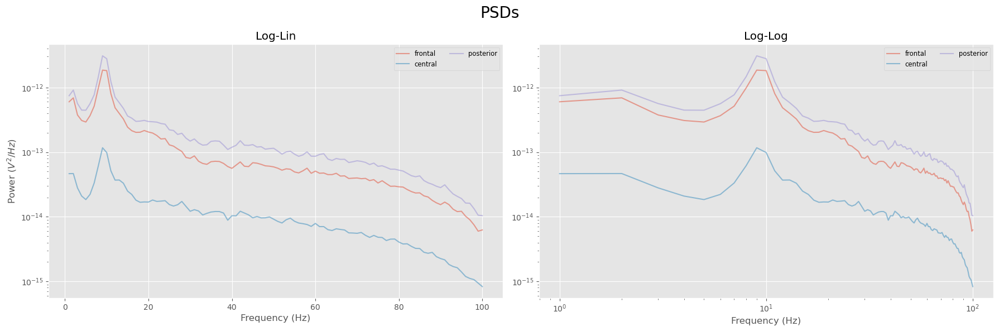

Group Summary: 
SPM_fit_quality_warning       False
spectra_count                     3
null_fits                         0
error_mean                 0.036872
r2_mean                    0.974659
flagged_channels                 []
peaks_count_max                   4
peaks_count_mean           2.666667
dtype: object
                                                                                                  
                                          GROUP RESULTS                                           
                                                                                                  
                             Number of power spectra in the Group: 3                              
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                        

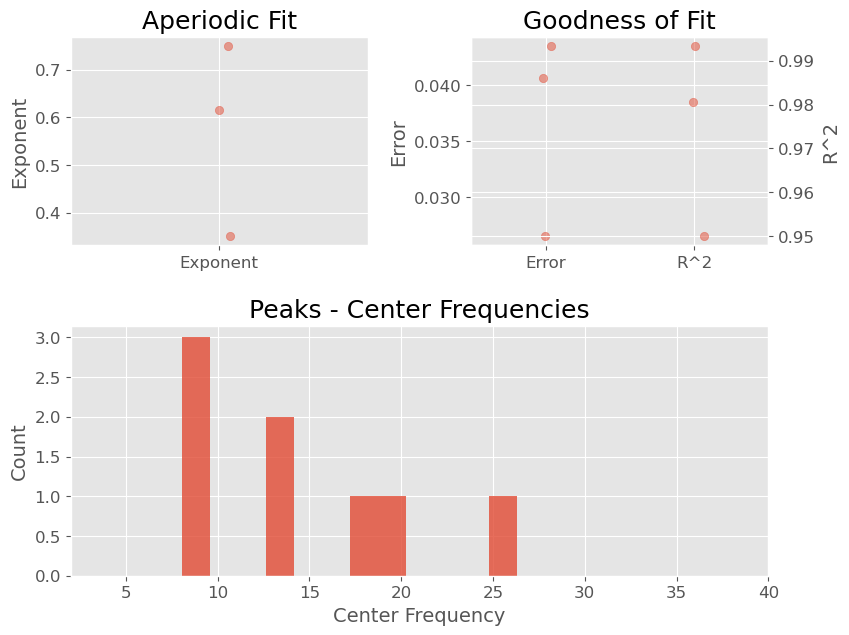

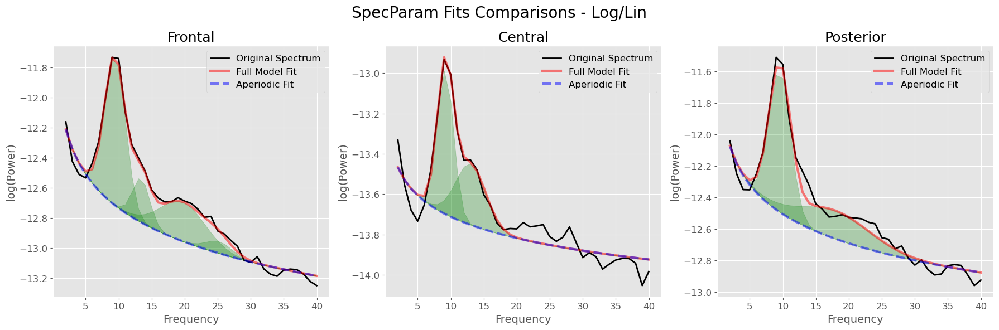

SpecParam for Channel: frontal
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.9860, 0.7492                                         
                                                                                                  
                                       4 peaks were found:                    

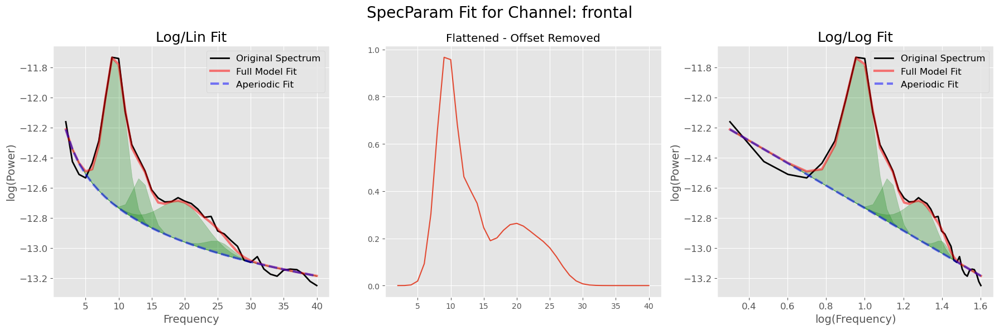

SpecParam for Channel: central
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -13.3608, 0.3512                                         
                                                                                                  
                                       2 peaks were found:                    

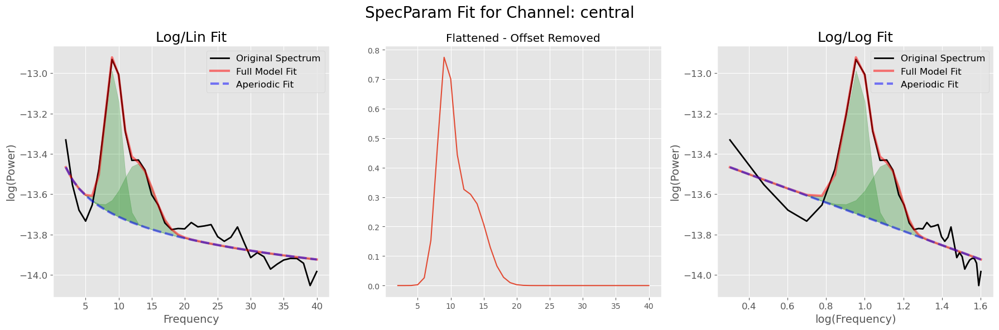

SpecParam for Channel: posterior
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8903, 0.6155                                         
                                                                                                  
                                       2 peaks were found:                  

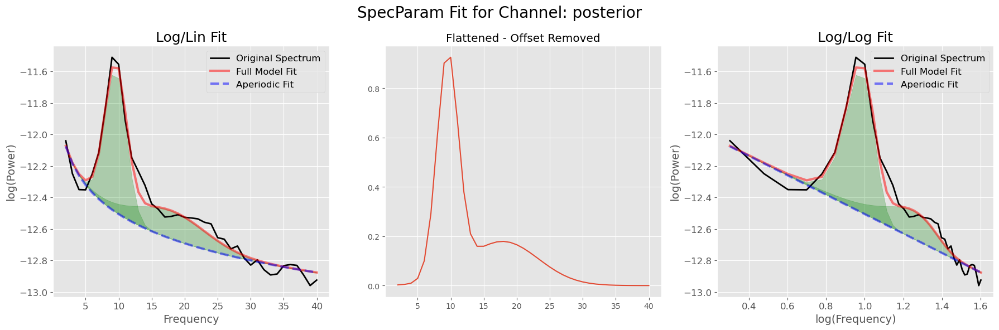

Effective window size : 1.000 (s)


Running group fits.:   0%|          | 0/63 [00:00<?, ?it/s]

/var/folders/wd/rhzj_w8570g_y66t6j6mh4zw0000gn/T/ipykernel_88956/1160174143.py:68: UserWarning: SpecParam Fit Issues
  warnings.warn(f'SpecParam Fit Issues', UserWarning)


<Power Spectrum (from Epochs, welch method) | 252 epochs × 63 channels × 100 freqs, 1.0-100.0 Hz>
<Info | 11 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, P3, P7, ...
 chs: 63 EEG
 custom_ref_applied: True
 dig: 66 items (3 Cardinal, 63 EEG)
 file_id: 4 items (dict)
 highpass: 1.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 meas_id: 4 items (dict)
 nchan: 63
 projs: []
 sfreq: 500.0 Hz
>


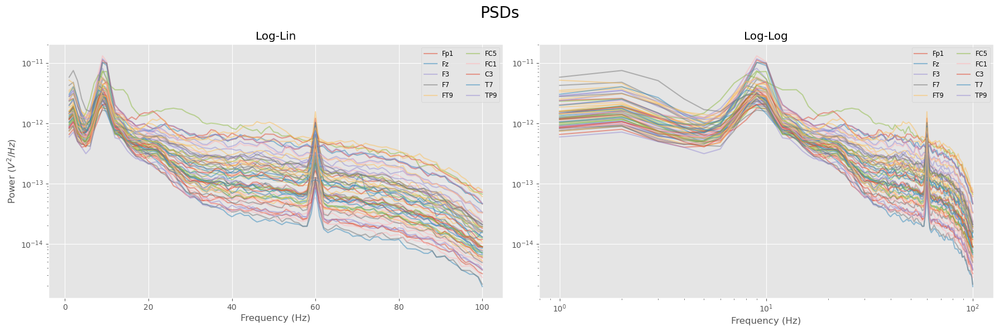

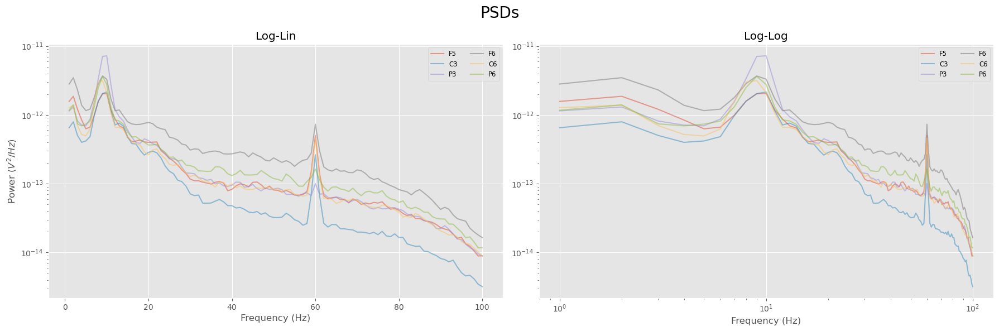

Group Summary: 
SPM_fit_quality_warning                      True
spectra_count                                  63
null_fits                                       0
error_mean                               0.046871
r2_mean                                  0.969832
flagged_channels           [5, 8, 11, 20, 54, 57]
peaks_count_max                                 5
peaks_count_mean                         2.333333
dtype: object
                                                                                                  
                                          GROUP RESULTS                                           
                                                                                                  
                             Number of power spectra in the Group: 63                             
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz 

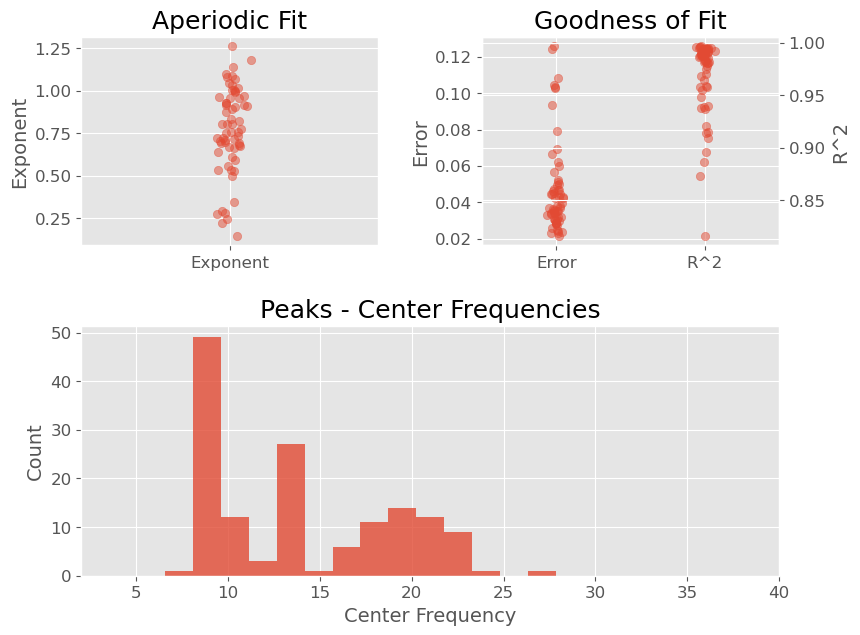

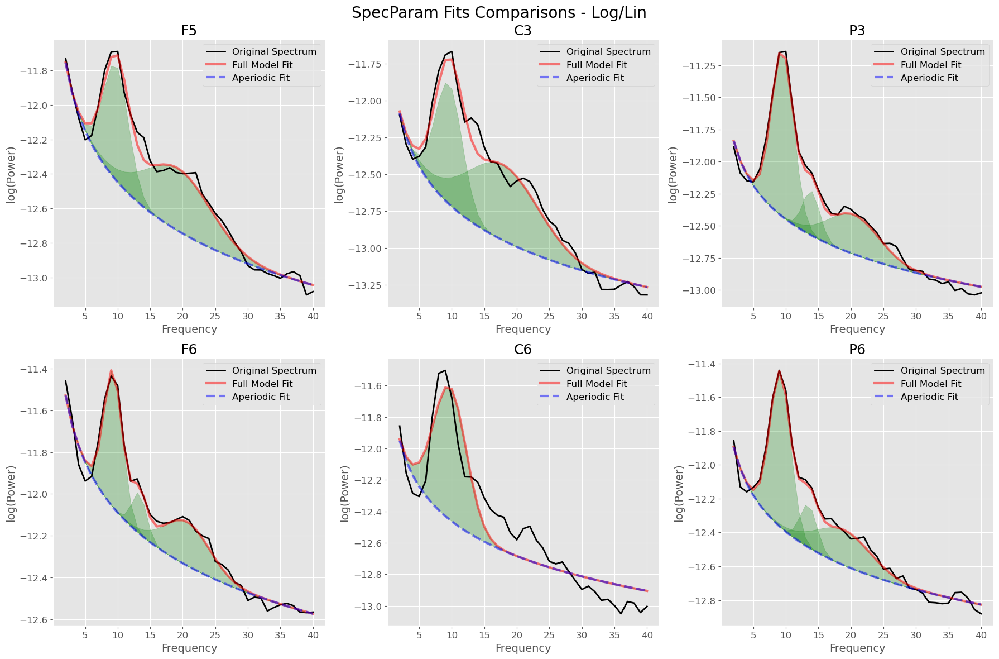

SpecParam for Channel: FC5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8455, 0.6828                                         
                                                                                                  
                                       1 peaks were found:                        

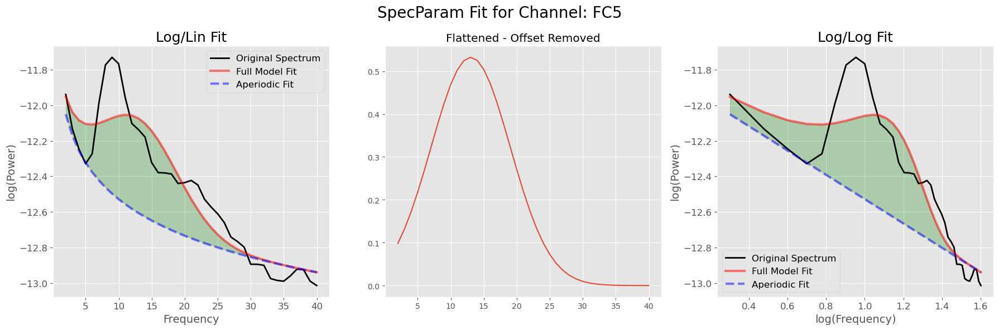

SpecParam for Channel: T7
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6815, 0.7582                                         
                                                                                                  
                                       1 peaks were found:                         

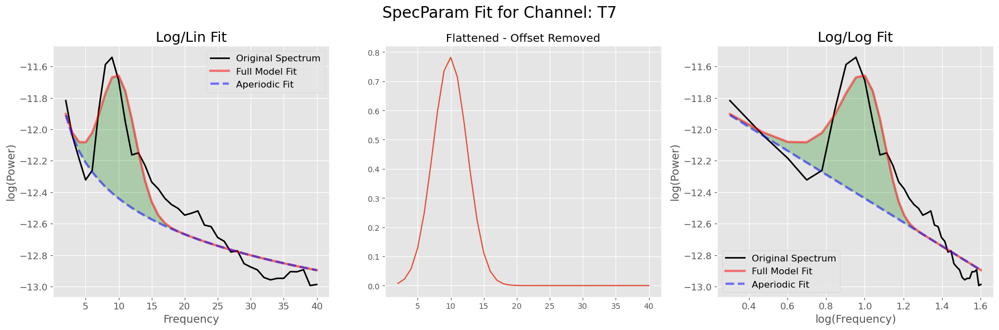

SpecParam for Channel: CP1
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.0352, 1.2627                                         
                                                                                                  
                                       1 peaks were found:                        

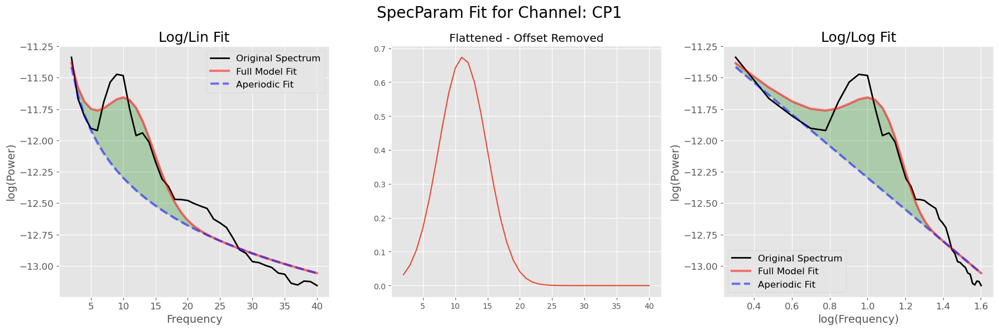

SpecParam for Channel: CP6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6622, 0.7502                                         
                                                                                                  
                                       1 peaks were found:                        

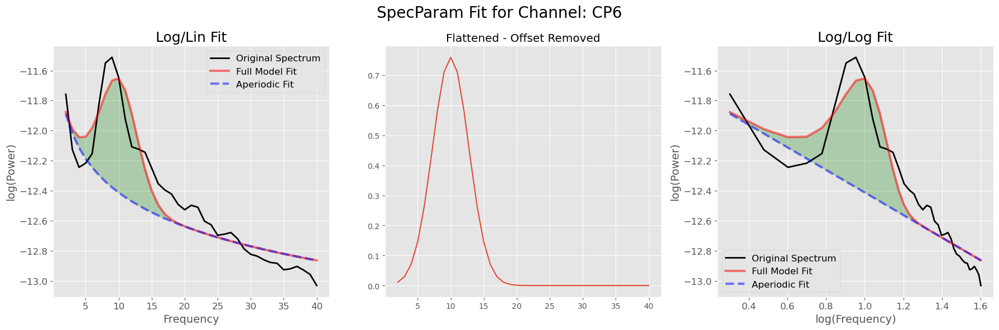

SpecParam for Channel: C6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7289, 0.7341                                         
                                                                                                  
                                       1 peaks were found:                         

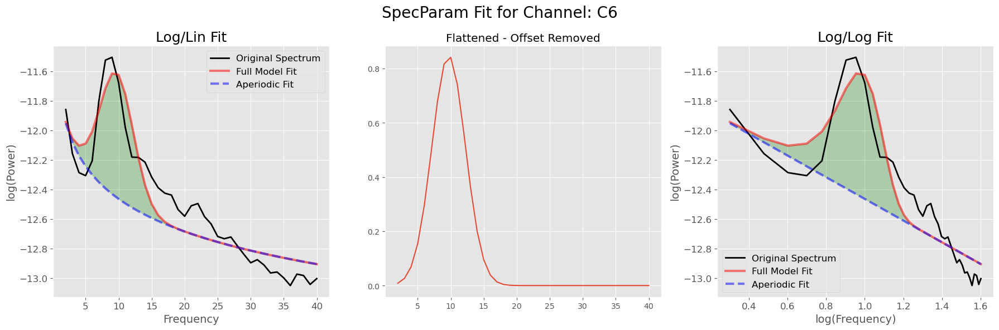

SpecParam for Channel: FT8
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.3806, 0.9550                                         
                                                                                                  
                                       1 peaks were found:                        

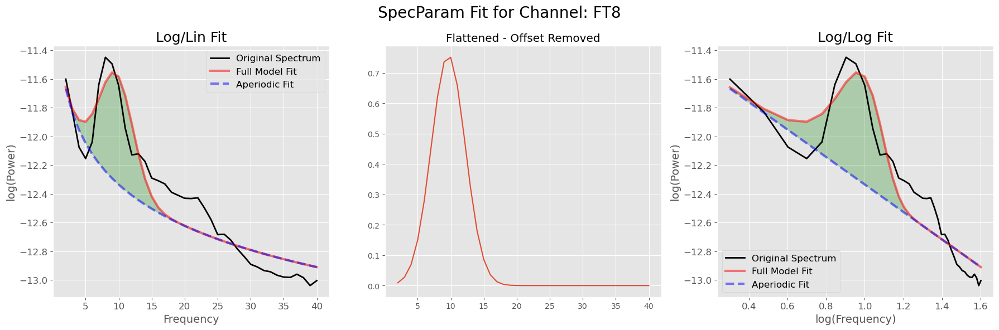

SpecParam for Channel: F5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.4581, 0.9901                                         
                                                                                                  
                                       2 peaks were found:                         

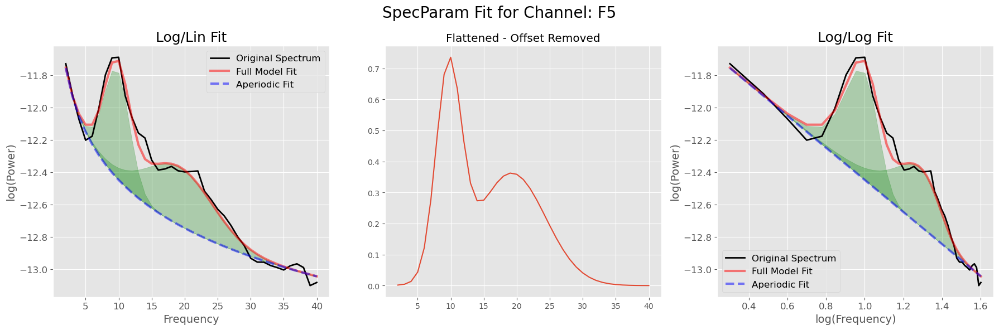

SpecParam for Channel: C3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.8132, 0.9068                                         
                                                                                                  
                                       2 peaks were found:                         

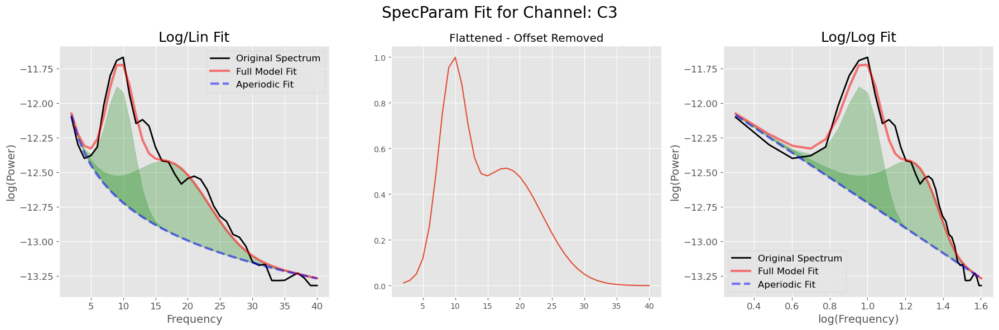

SpecParam for Channel: P3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.5759, 0.8735                                         
                                                                                                  
                                       3 peaks were found:                         

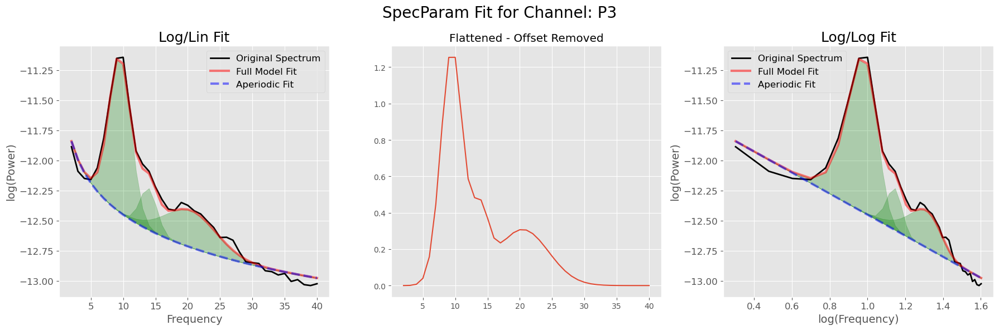

SpecParam for Channel: F6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.2872, 0.8029                                         
                                                                                                  
                                       3 peaks were found:                         

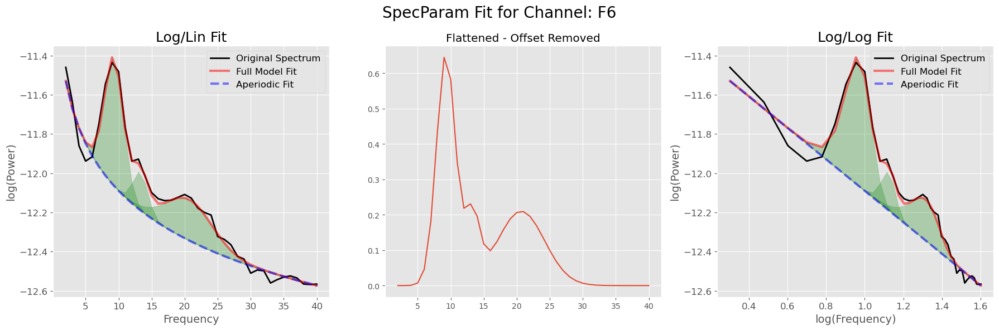

SpecParam for Channel: C6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7289, 0.7341                                         
                                                                                                  
                                       1 peaks were found:                         

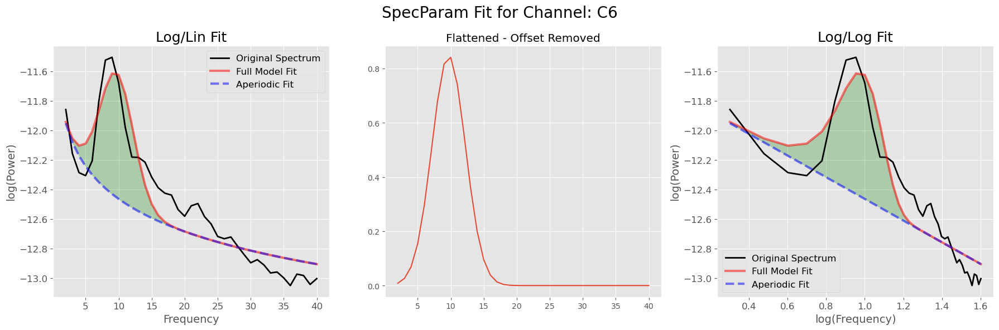

SpecParam for Channel: P6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.6792, 0.7161                                         
                                                                                                  
                                       3 peaks were found:                         

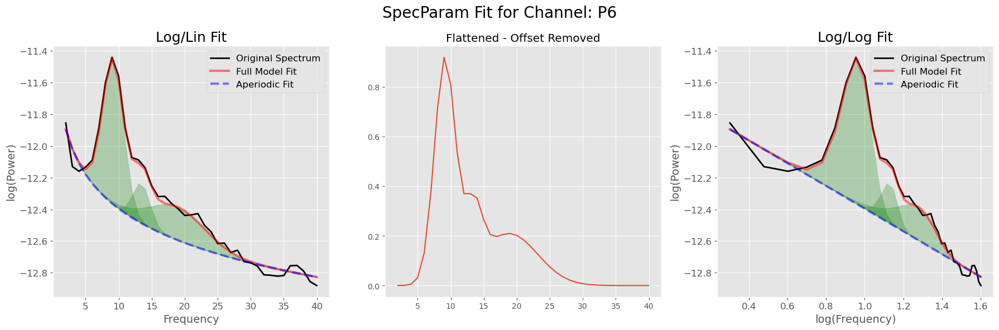


-----------------------------------------------------------------------------------------------
Subject: sub-102
---Get EEG Preprocessed Data - FIF ----------------------------------
Reading /Users/stuartgow/GitHub/EEG_ML_Pipeline/Data/Study_IOWA_Rest/1_EEG_Processing_Results/1a_EEG_Preprocessing_Run_20250724_full_ica/Cleaned_files/sub-102_preprocessed_epo.fif ...
    Found the data of interest:
        t =       0.00 ...     998.00 ms
        0 CTF compensation matrices available
Not setting metadata
189 matching events found
No baseline correction applied
0 projection items activated
Description: None on None
<EpochsFIF | 189 events (all good), 0 – 0.998 s (baseline off), ~45.5 MiB, data loaded,
 '1': 189>
<Info | 11 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, P3, P7, ...
 chs: 63 EEG
 custom_ref_applied: True
 dig: 66 items (3 Cardinal, 63 EEG)
 file_id: 4 items (dict)
 highpass: 1.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 mea

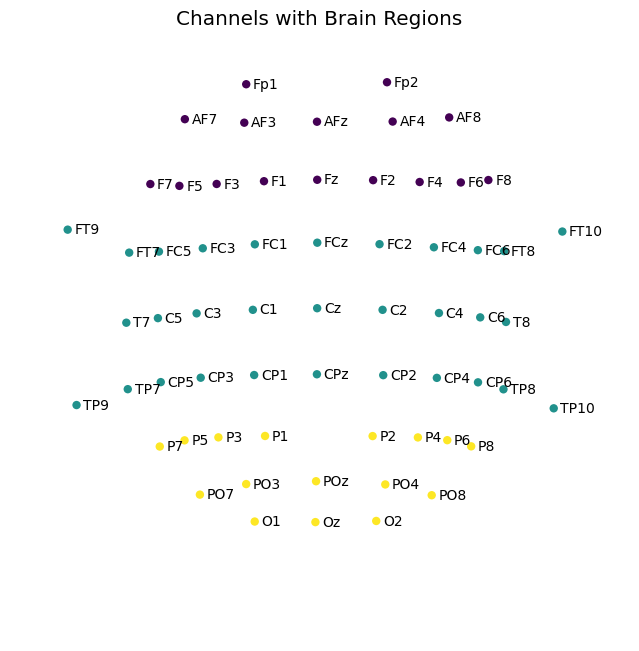

Not setting metadata
189 matching events found
No baseline correction applied
0 projection items activated
Effective window size : 1.000 (s)


Running group fits.:   0%|          | 0/3 [00:00<?, ?it/s]

<Power Spectrum (from Epochs, welch method) | 189 epochs × 3 channels × 100 freqs, 1.0-100.0 Hz>
<Info | 7 non-empty values
 bads: []
 ch_names: frontal, central, posterior
 chs: 3 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 3
 projs: []
 sfreq: 500.0 Hz
>


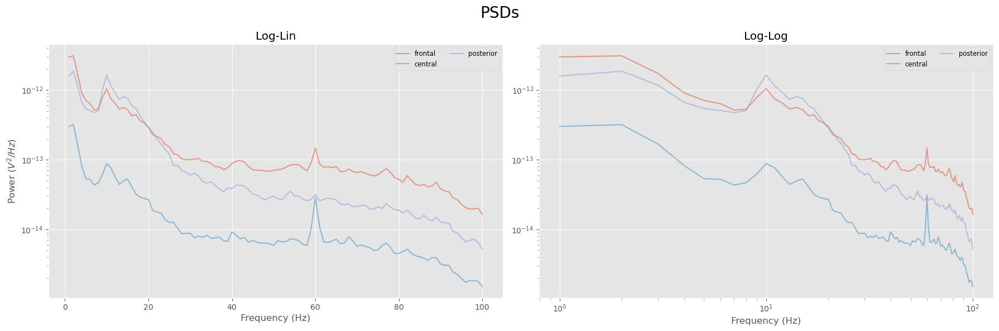

Group Summary: 
SPM_fit_quality_warning       False
spectra_count                     3
null_fits                         0
error_mean                 0.031117
r2_mean                    0.990928
flagged_channels                 []
peaks_count_max                   3
peaks_count_mean                3.0
dtype: object
                                                                                                  
                                          GROUP RESULTS                                           
                                                                                                  
                             Number of power spectra in the Group: 3                              
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                        

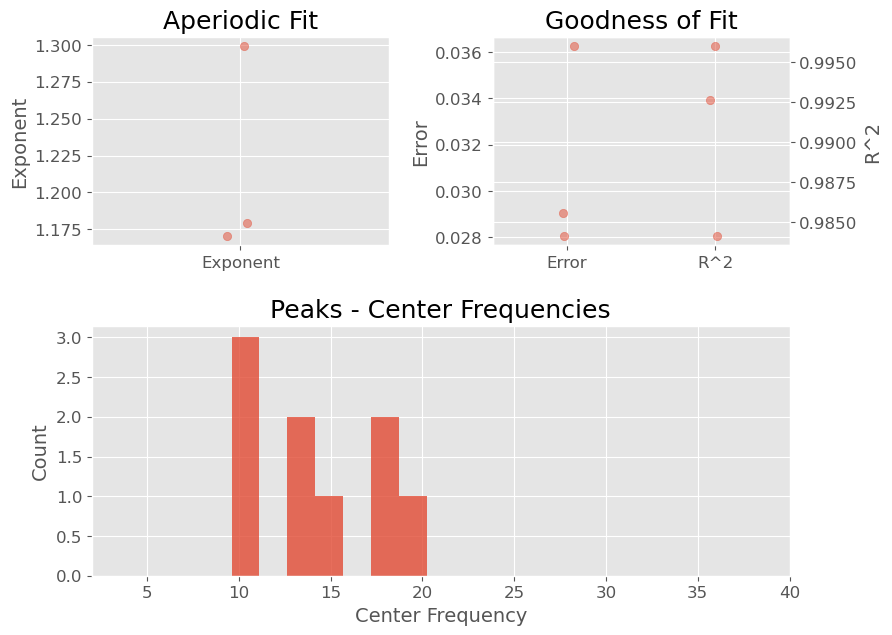

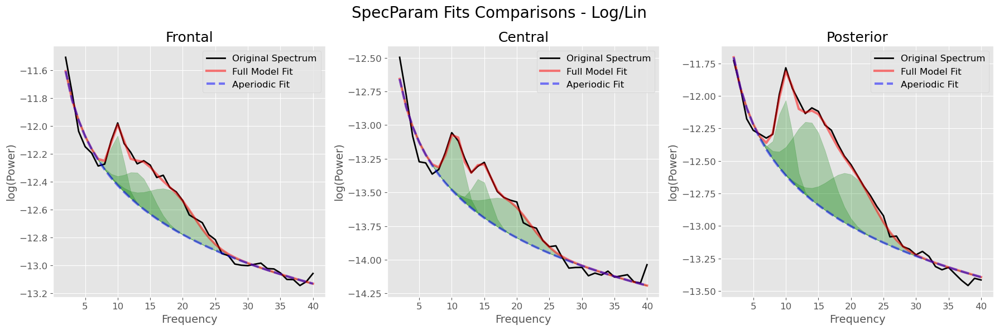

SpecParam for Channel: frontal
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.2556, 1.1706                                         
                                                                                                  
                                       3 peaks were found:                    

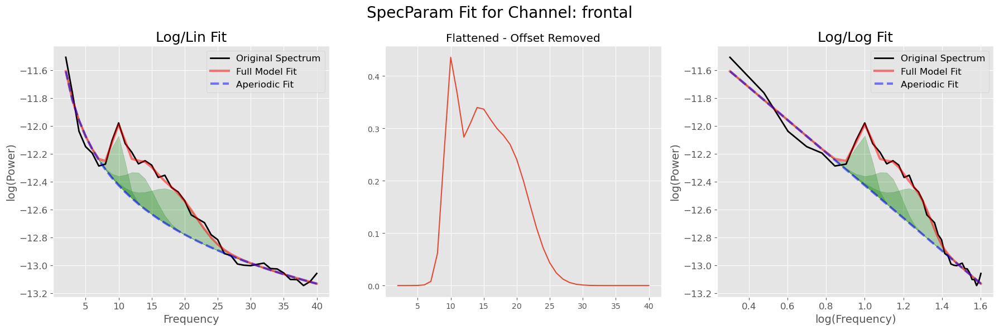

SpecParam for Channel: central
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -12.3027, 1.1790                                         
                                                                                                  
                                       3 peaks were found:                    

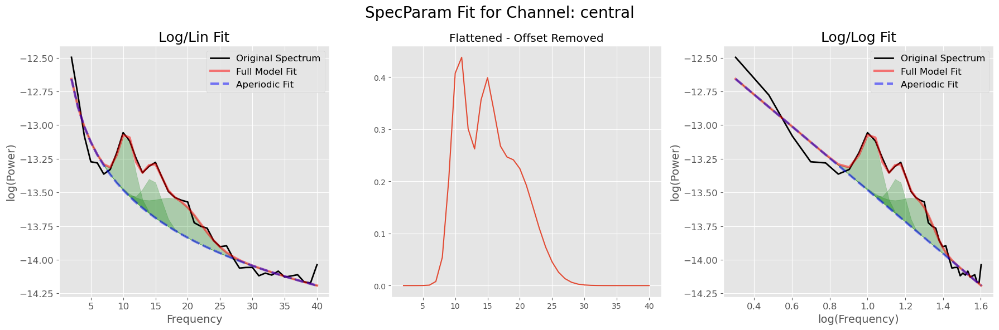

SpecParam for Channel: posterior
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.3119, 1.2992                                         
                                                                                                  
                                       3 peaks were found:                  

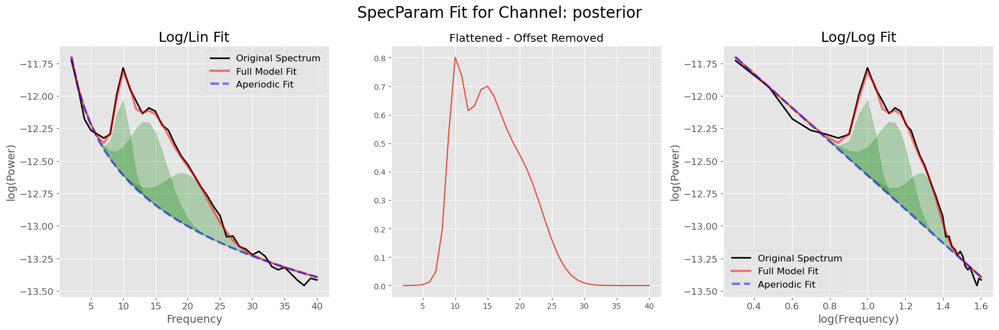

Effective window size : 1.000 (s)


Running group fits.:   0%|          | 0/63 [00:00<?, ?it/s]

<Power Spectrum (from Epochs, welch method) | 189 epochs × 63 channels × 100 freqs, 1.0-100.0 Hz>
<Info | 11 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, P3, P7, ...
 chs: 63 EEG
 custom_ref_applied: True
 dig: 66 items (3 Cardinal, 63 EEG)
 file_id: 4 items (dict)
 highpass: 1.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 meas_id: 4 items (dict)
 nchan: 63
 projs: []
 sfreq: 500.0 Hz
>


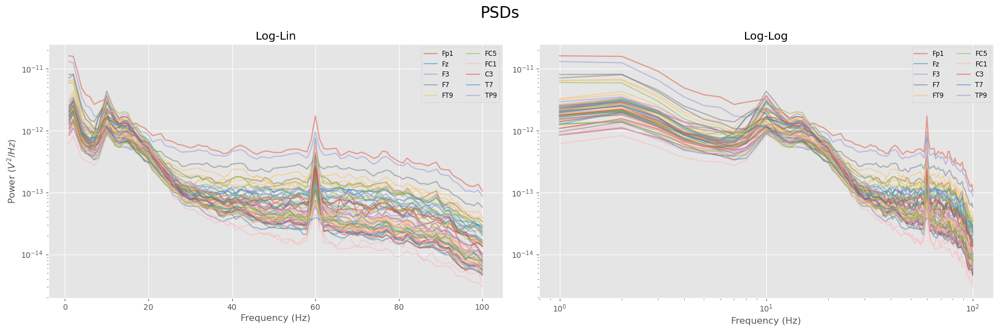

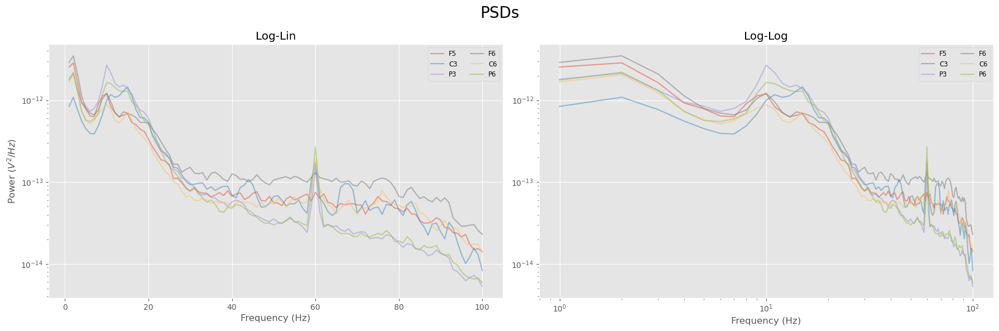

Group Summary: 
SPM_fit_quality_warning       False
spectra_count                    63
null_fits                         0
error_mean                 0.041436
r2_mean                    0.987003
flagged_channels                 []
peaks_count_max                   5
peaks_count_mean           2.253968
dtype: object
                                                                                                  
                                          GROUP RESULTS                                           
                                                                                                  
                             Number of power spectra in the Group: 63                             
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                        

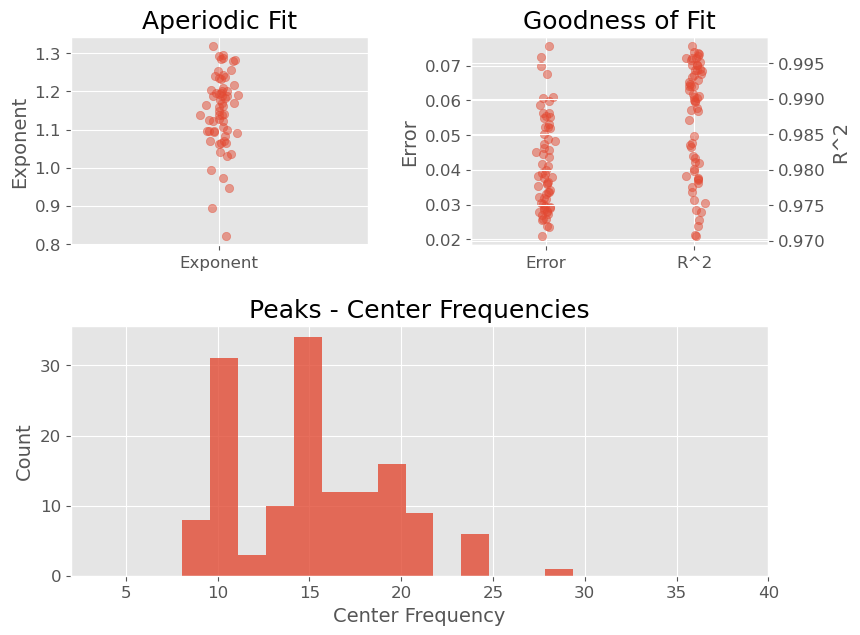

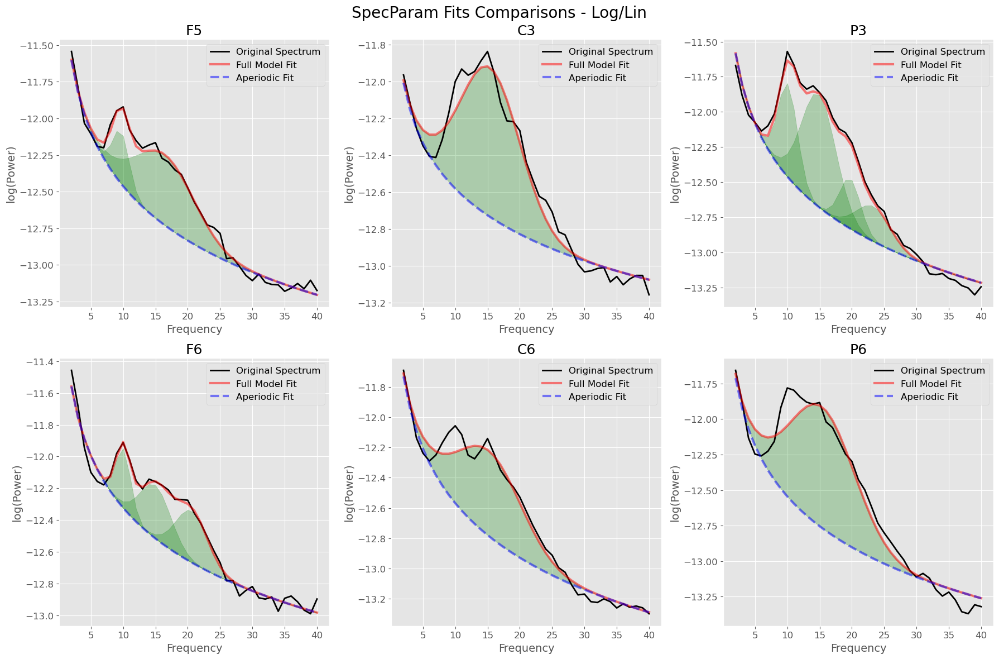

SpecParam for Channel: F5
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.2319, 1.2318                                         
                                                                                                  
                                       2 peaks were found:                         

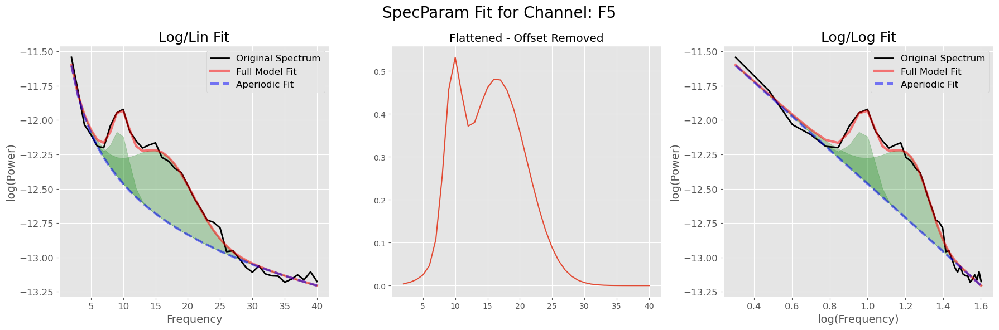

SpecParam for Channel: C3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.7590, 0.8215                                         
                                                                                                  
                                       1 peaks were found:                         

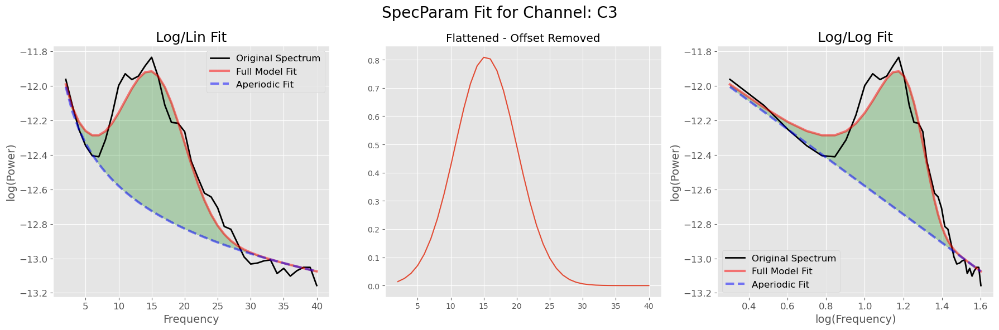

SpecParam for Channel: P3
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.2055, 1.2538                                         
                                                                                                  
                                       4 peaks were found:                         

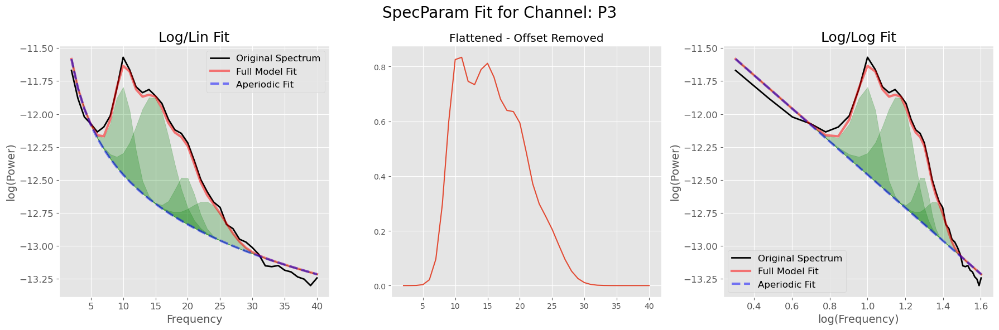

SpecParam for Channel: F6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.2283, 1.0956                                         
                                                                                                  
                                       3 peaks were found:                         

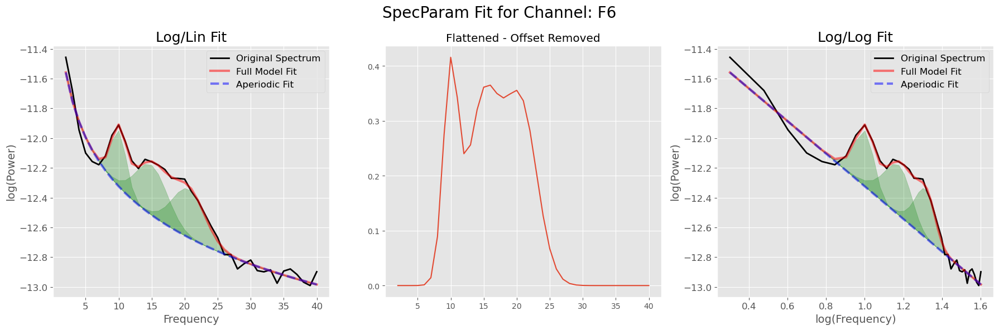

SpecParam for Channel: C6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.3673, 1.2010                                         
                                                                                                  
                                       1 peaks were found:                         

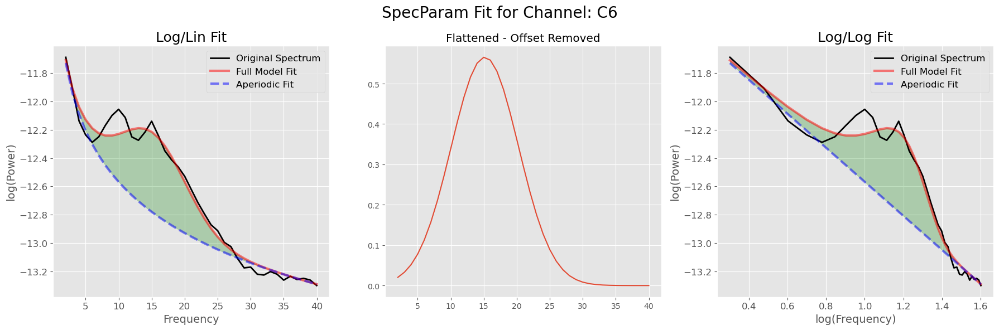

SpecParam for Channel: P6
                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 1.00 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -11.3545, 1.1901                                         
                                                                                                  
                                       1 peaks were found:                         

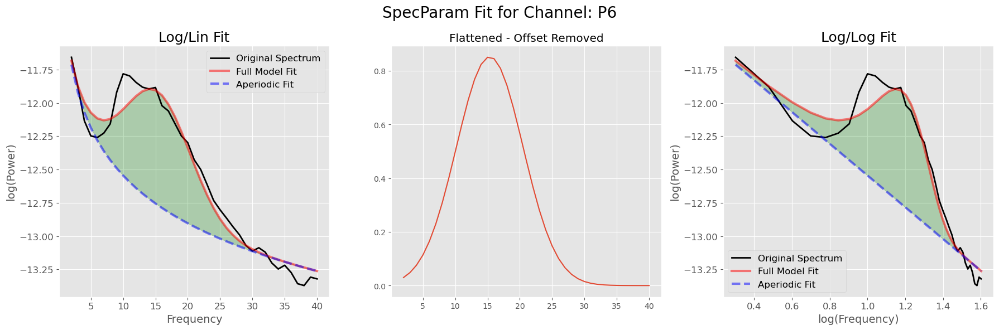

In [10]:
# Run all the steps for EEG feature extraction
#

# Start Trace
summary = f'EEG Feature Extraction'
summary = summary + f"\n- Study: {study_info['study_name']} {study_info['dataset_ref']}"
summary = summary + f"\n- Run: {run_details['run_name']}"
summary = summary + f"\n- EEG Preprocessed Data Source: {run_details['eeg_preprocessed_data']}"
summary = summary + f"\n- PSD Params: {psd_params}"
summary = summary + f"\n- SpecParam Params: {specparam_params}"
print(summary)

all_subjects_results = pd.DataFrame()
all_subjects_summaries = pd.DataFrame()

# Loop through all selected subjects in the study
for idx, subject in study_subjects_df.iterrows():

    # Just sample a subset of subjects when in test mode
    if test_mode and idx not in TEST_SUBJECTS:
        continue

    subject_id = subject['subject_id']
    print('\n-----------------------------------------------------------------------------------------------')
    print(f'Subject: {subject_id}')

    # EEG Preprocessed Data Load
    #
    print('---Get EEG Preprocessed Data - FIF ----------------------------------')
    source_file_path = utils.get_file_path(eeg_preprocessed_data_path, f"{subject['subject_id']}_preprocessed_epo.fif")
    eeg_preprocessed_epoch = mne.read_epochs(source_file_path, preload=True, verbose=VERBOSE)
    preprocessing_results = pd.read_pickle(eeg_preprocessed_data_path + f'/{subject_id}_preprocessing_results.pkl', compression='zip')

    if VERBOSE:
        print(f"Description: {eeg_preprocessed_epoch.info['description']} on {eeg_preprocessed_epoch.info['meas_date']}")
        print(eeg_preprocessed_epoch)
        print(eeg_preprocessed_epoch.info)
        # plot_EEG_TD(EEG_preprocessed, test_channels) .. just the first epoch
    
    # SpecParam for Regions and all Individual Channels
    #
    print('---EEG Spectral Parameterisation------------------------------------')

    # For regions
    channel_groups = channels_setup(eeg_preprocessed_epoch)
    spm_regs_summary, spm_results_df = get_specparam(eeg_preprocessed_epoch, channel_groups)
    spm_results_df.insert(0, 'subject_id', subject_id)
    all_subjects_results = pd.concat([all_subjects_results, spm_results_df], ignore_index=True)

    # For all individual channels
    spm_chns_summary, spm_results_df = get_specparam(eeg_preprocessed_epoch)
    spm_results_df.insert(0, 'subject_id', subject_id)
    all_subjects_results = pd.concat([all_subjects_results, spm_results_df], ignore_index=True)

    # Collate Subject summaries
    spm_regs_summary = spm_regs_summary.add_prefix('reg_')
    spm_chns_summary = spm_chns_summary.add_prefix('chn_')
    subject_summary = pd.concat([pd.Series({'subject_id': subject_id}), preprocessing_results, 
                                 spm_regs_summary, spm_chns_summary])
    all_subjects_summaries = pd.concat(
        [all_subjects_summaries, subject_summary.to_frame().T],
        ignore_index=True
    )

# Save all the results (need to convert dtypes for summaries)
all_subjects_results.to_pickle(run_results_path + '/eeg_features_superset_df.pkl', compression='zip') 
all_subjects_summaries = all_subjects_summaries.convert_dtypes()
all_subjects_summaries.to_pickle(run_results_path + '/eeg_processing_results_df.pkl', compression='zip') 
